In [9]:
%matplotlib inline

import os
import sys
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns


In [10]:
input_file = "../data/raw/electricity.csv"
#output_path = "../../data/synthetic_fishing/"


In [11]:
full_data = pd.read_csv(input_file, index_col=0)


In [12]:
# Check for NaN or null values in the dataset
nan_summary = full_data.isnull().sum()

# Total number of NaN values in the dataset
total_nan = full_data.isnull().sum().sum()

# Display columns with NaN values and their counts
print("NaN Counts Per Column:")
print(nan_summary[nan_summary > 0])  # Show only columns with NaN values

print(f"\nTotal number of NaN values in the dataset: {total_nan}")


NaN Counts Per Column:
Series([], dtype: int64)

Total number of NaN values in the dataset: 0


In [13]:
full_data.describe()


,0,1,2,3,4,5,6,7,8,9,...,311,312,313,314,315,316,317,318,319,conso
count,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,...,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000
mean,23.263762,112.885569,16.821624,440.335196,200.536724,755.035166,25.943659,1022.549270,214.867321,227.069267,...,2072.031592,1165.538853,200529.124848,10065.918491,15678.371236,350.702137,51.490344,2264.188641,507.008858,3335.883744
std,24.127164,25.553141,49.190377,152.601050,69.727348,249.598861,27.392344,231.480251,83.792517,102.182571,...,1211.430647,736.035668,146054.610575,6568.697998,9738.020500,241.241444,37.228837,545.279372,267.445473,552.754335
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.000000,95.000000,8.000000,334.750000,148.000000,572.000000,13.000000,840.000000,157.000000,149.000000,...,850.000000,452.000000,69300.000000,3639.000000,6456.000000,94.000000,27.000000,1999.000000,233.000000,2920.000000
50%,11.000000,113.000000,8.000000,400.000000,190.000000,725.000000,16.000000,1015.000000,194.000000,204.000000,...,1962.500000,1278.000000,174000.000000,9361.000000,13866.000000,361.000000,37.000000,2319.000000,504.000000,3271.000000
75%,24.000000,130.000000,10.000000,511.000000,239.000000,881.000000,24.000000,1169.000000,253.000000,283.000000,...,3019.000000,1726.000000,267725.000000,14719.250000,24706.000000,505.000000,57.000000,2607.000000,704.000000,3632.000000
max,140.000000,296.000000,601.000000,1170.000000,547.000000,1984.000000,178.000000,2102.000000,600.000000,752.000000,...,5749.000000,3340.000000,764000.000000,28572.000000,39728.000000,1330.000000,205.000000,4449.000000,1369.000000,6035.000000


In [20]:
full_data.columns


Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '311', '312', '313', '314', '315', '316', '317', '318', '319', 'conso'],
      dtype='object', length=321)

In [21]:
full_data.info


<bound method DataFrame.info of                         0      1      2      3      4       5     6       7  \
date                                                                          
2016-07-01 02:00:00  14.0   69.0  234.0  415.0  215.0  1056.0  29.0   840.0   
2016-07-01 03:00:00  18.0   92.0  312.0  556.0  292.0  1363.0  29.0  1102.0   
2016-07-01 04:00:00  21.0   96.0  312.0  560.0  272.0  1240.0  29.0  1025.0   
2016-07-01 05:00:00  20.0   92.0  312.0  443.0  213.0   845.0  24.0   833.0   
2016-07-01 06:00:00  22.0   91.0  312.0  346.0  190.0   647.0  16.0   733.0   
...                   ...    ...    ...    ...    ...     ...   ...     ...   
2019-07-01 21:00:00  11.0  116.0    8.0  844.0  384.0  1590.0  51.0  1412.0   
2019-07-01 22:00:00  11.0  103.0    8.0  749.0  371.0  1366.0  47.0  1265.0   
2019-07-01 23:00:00  12.0   93.0    8.0  650.0  346.0  1282.0  48.0  1079.0   
2019-07-02 00:00:00  10.0   92.0    8.0  646.0  349.0  1261.0  48.0  1009.0   
2019-07-02 01:00:00 

In [22]:
full_data.head()


,0,1,2,3,4,5,6,7,8,9,...,311,312,313,314,315,316,317,318,319,conso
date,,,,,,,,,,,,,,,,,,,,,
2016-07-01 02:00:00,14.0,69.0,234.0,415.0,215.0,1056.0,29.0,840.0,226.0,265.0,...,676.0,372.0,80100.0,4719.0,5002.0,48.0,38.0,1558.0,182.0,2162.0
2016-07-01 03:00:00,18.0,92.0,312.0,556.0,292.0,1363.0,29.0,1102.0,271.0,340.0,...,805.0,452.0,95200.0,4643.0,6617.0,65.0,47.0,2177.0,253.0,2835.0
2016-07-01 04:00:00,21.0,96.0,312.0,560.0,272.0,1240.0,29.0,1025.0,270.0,300.0,...,817.0,430.0,96600.0,4285.0,6571.0,64.0,43.0,2193.0,218.0,2764.0
2016-07-01 05:00:00,20.0,92.0,312.0,443.0,213.0,845.0,24.0,833.0,179.0,211.0,...,801.0,291.0,94500.0,4222.0,6365.0,65.0,39.0,1315.0,195.0,2735.0
2016-07-01 06:00:00,22.0,91.0,312.0,346.0,190.0,647.0,16.0,733.0,186.0,179.0,...,807.0,279.0,91300.0,4116.0,6298.0,75.0,40.0,1378.0,191.0,2721.0


In [23]:
full_data.tail()


,0,1,2,3,4,5,6,7,8,9,...,311,312,313,314,315,316,317,318,319,conso
date,,,,,,,,,,,,,,,,,,,,,
2019-07-01 21:00:00,11.0,116.0,8.0,844.0,384.0,1590.0,51.0,1412.0,407.0,351.0,...,1897.0,1589.0,166500.0,9917.0,10412.0,324.0,21.0,1870.0,162.0,2773.0
2019-07-01 22:00:00,11.0,103.0,8.0,749.0,371.0,1366.0,47.0,1265.0,369.0,327.0,...,1374.0,1336.0,158800.0,6812.0,8956.0,302.0,20.0,1506.0,438.0,2755.0
2019-07-01 23:00:00,12.0,93.0,8.0,650.0,346.0,1282.0,48.0,1079.0,308.0,283.0,...,938.0,1311.0,154300.0,6602.0,5910.0,302.0,18.0,1864.0,621.0,2650.0
2019-07-02 00:00:00,10.0,92.0,8.0,646.0,349.0,1261.0,48.0,1009.0,288.0,292.0,...,833.0,1227.0,141900.0,6546.0,5502.0,259.0,33.0,2623.0,783.0,2719.0
2019-07-02 01:00:00,11.0,88.0,8.0,648.0,337.0,1234.0,46.0,1005.0,261.0,294.0,...,783.0,1089.0,112300.0,6188.0,4934.0,115.0,31.0,2706.0,647.0,2640.0


In [15]:
df = full_data.copy()


In [16]:
l, sh, dim, siz = len(df), df.shape, df.ndim, df.size


In [17]:
print(l, sh, dim, siz)


26304 (26304, 321) 2 8443584


In [27]:
rdf = df.to_numpy().reshape(df.shape[0], df.shape[1], 1)
rdf.shape


(26304, 321, 1)

array([<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
       <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequ

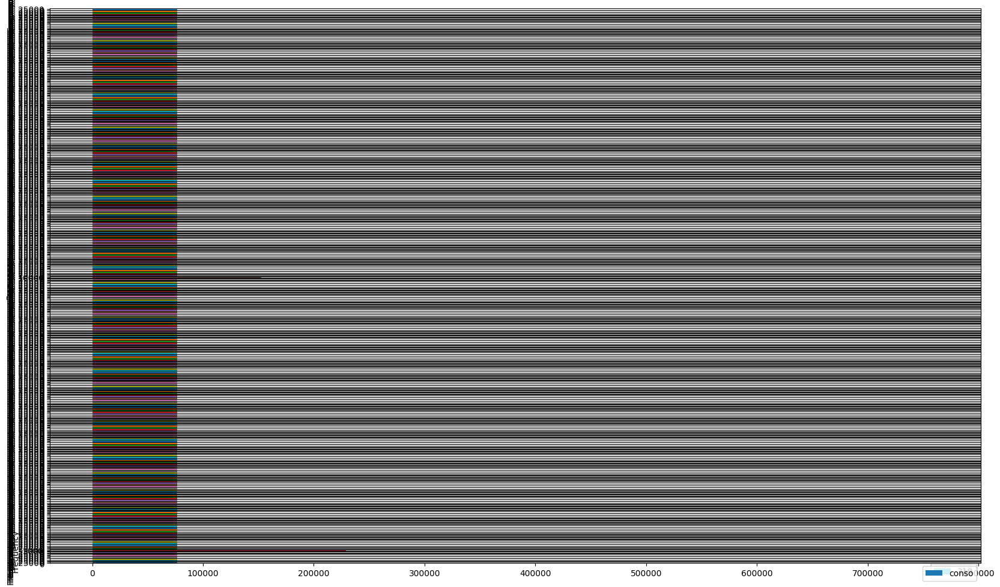

In [28]:
df.plot(kind='hist', subplots=True, figsize=(20, 12))


array([[<Axes: title={'center': '0'}>, <Axes: title={'center': '1'}>,
        <Axes: title={'center': '2'}>, <Axes: title={'center': '3'}>,
        <Axes: title={'center': '4'}>, <Axes: title={'center': '5'}>,
        <Axes: title={'center': '6'}>, <Axes: title={'center': '7'}>,
        <Axes: title={'center': '8'}>, <Axes: title={'center': '9'}>,
        <Axes: title={'center': '10'}>, <Axes: title={'center': '11'}>,
        <Axes: title={'center': '12'}>, <Axes: title={'center': '13'}>,
        <Axes: title={'center': '14'}>, <Axes: title={'center': '15'}>,
        <Axes: title={'center': '16'}>, <Axes: title={'center': '17'}>],
       [<Axes: title={'center': '18'}>, <Axes: title={'center': '19'}>,
        <Axes: title={'center': '20'}>, <Axes: title={'center': '21'}>,
        <Axes: title={'center': '22'}>, <Axes: title={'center': '23'}>,
        <Axes: title={'center': '24'}>, <Axes: title={'center': '25'}>,
        <Axes: title={'center': '26'}>, <Axes: title={'center': '27'}>,
 

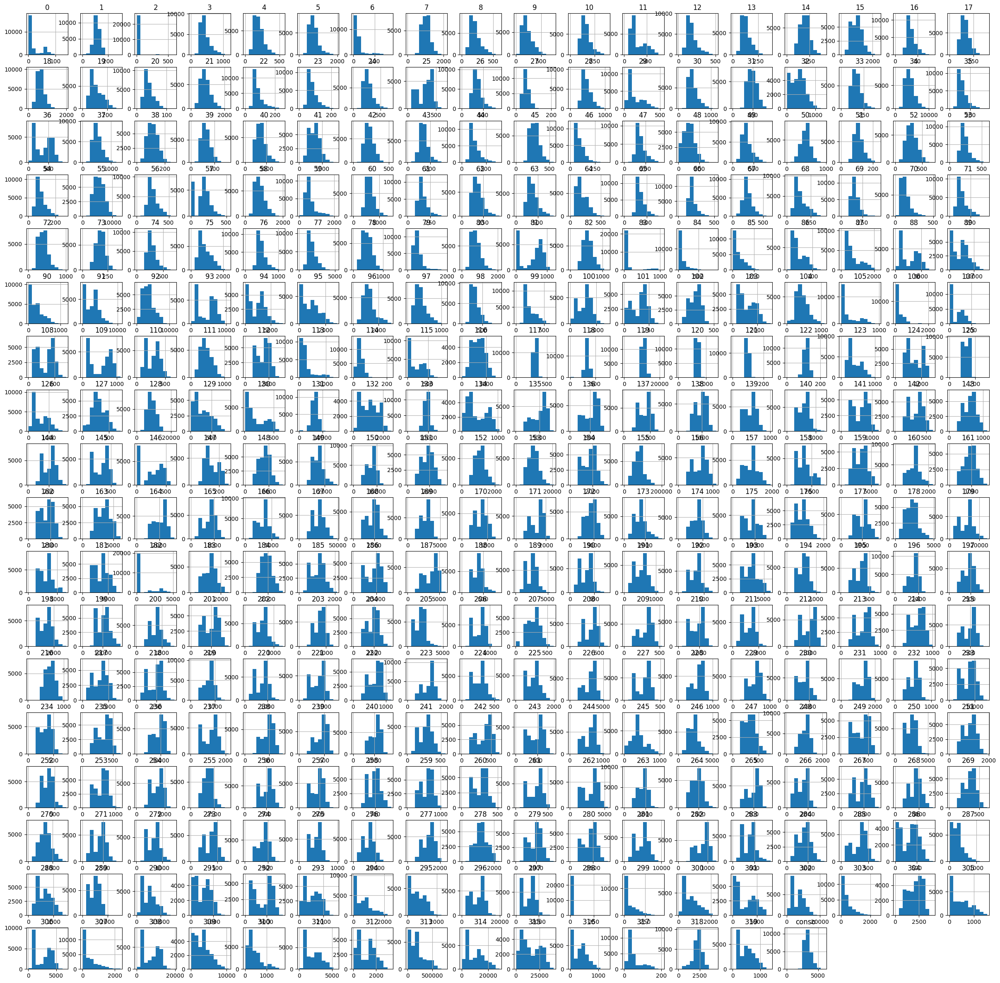

In [29]:
df.hist(figsize=(30, 30))


<Axes: xlabel='conso', ylabel='1'>

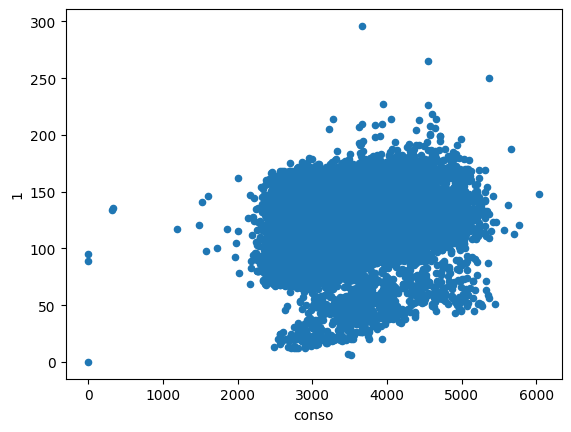

In [30]:
df.plot.scatter(x="conso", y="1")


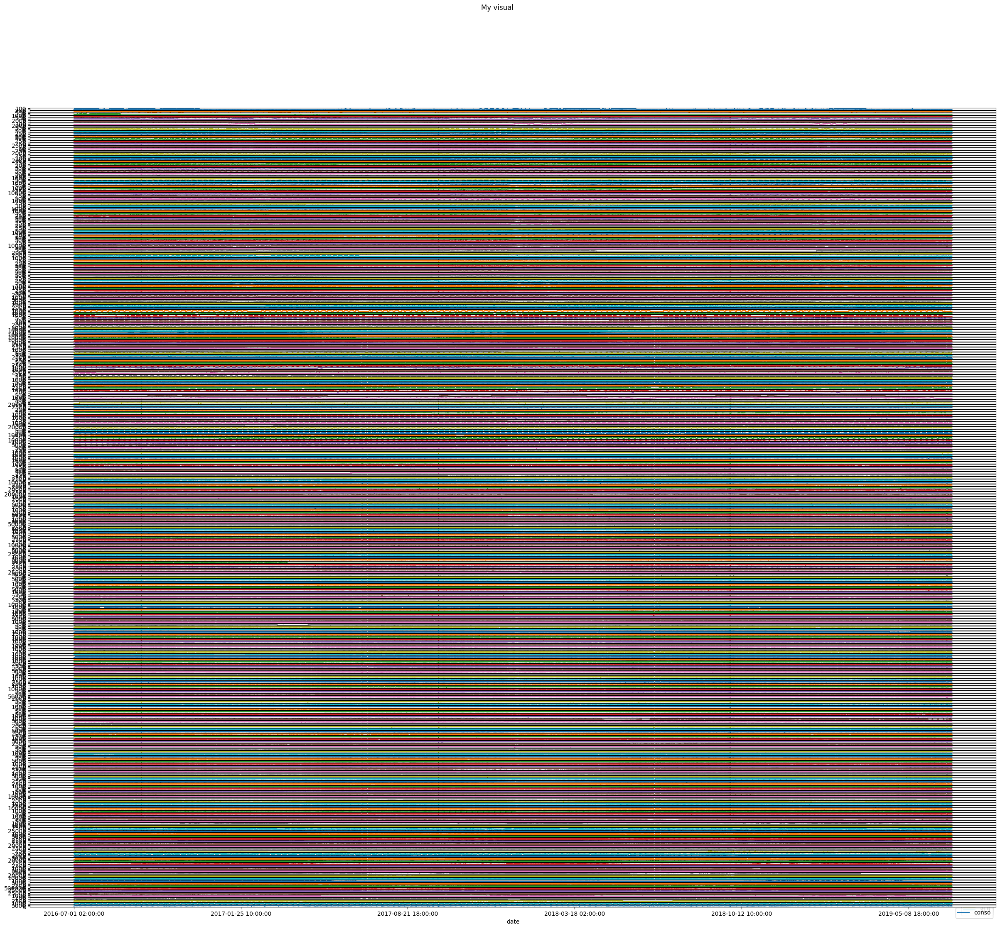

In [31]:
df.plot(subplots=True, figsize=(30, 25), title="My visual")
plt.show()


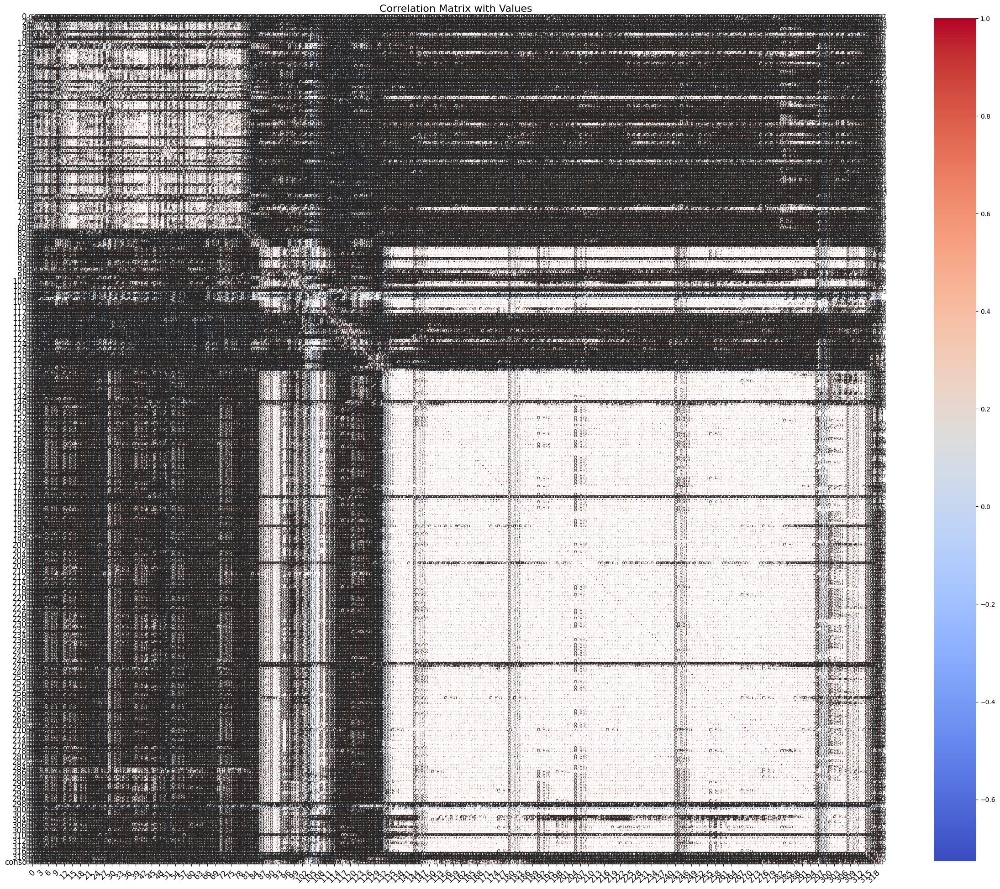

In [32]:
# Calculate the correlation matrix
corr_matrix = df.corr()

# Plot the heatmap
plt.figure(figsize=(30, 30))  # Adjust figure size
sns.heatmap(
    corr_matrix,
    annot=True,            # Show correlation values on the heatmap
    fmt=".2f",             # Format values to 2 decimal places
    cmap="coolwarm",       # Diverging color map (red = negative, blue = positive)
    square=True,           # Keep cells square-shaped
    linewidths=0.5,        # Add clear grid lines between cells
    cbar_kws={"shrink": 0.8}  # Shrink the color bar
)

# Add labels and a title
plt.title("Correlation Matrix with Values", fontsize=16)
plt.xticks(fontsize=12, rotation=45)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=12)
plt.show()


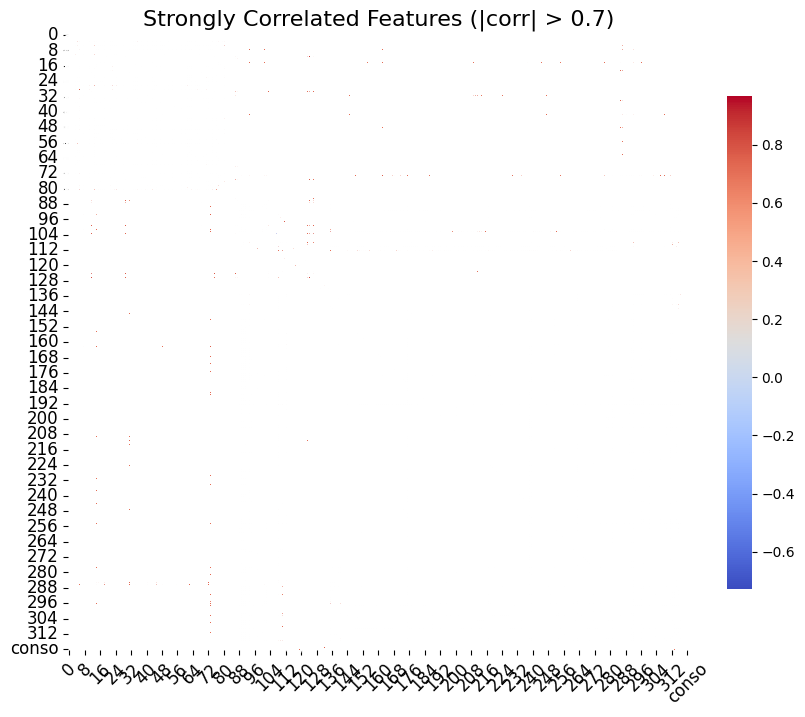

In [18]:
# Calculate the correlation matrix
corr_matrix = df.corr()

# Set a threshold for strong correlations
threshold = 0.7

# Extract strongly correlated pairs
strong_corr = corr_matrix[(corr_matrix.abs() > threshold) & (corr_matrix.abs() < 1.0)]

# Plot the heatmap with strong correlations only
plt.figure(figsize=(10, 8))
sns.heatmap(
    strong_corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)
plt.title("Strongly Correlated Features (|corr| > 0.7)", fontsize=16)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.show()


In [7]:
df_ = df.copy()
df_.drop(columns=['Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'rv1', 'rv2'], inplace=True)
save_path = "../data/raw/electricity_data.csv"
df_.to_csv(save_path, index=True)
print(f"Processed dataset saved to {save_path}")


NameError: name 'df' is not defined

In [33]:
new_data = pd.read_csv(save_path, index_col=0)


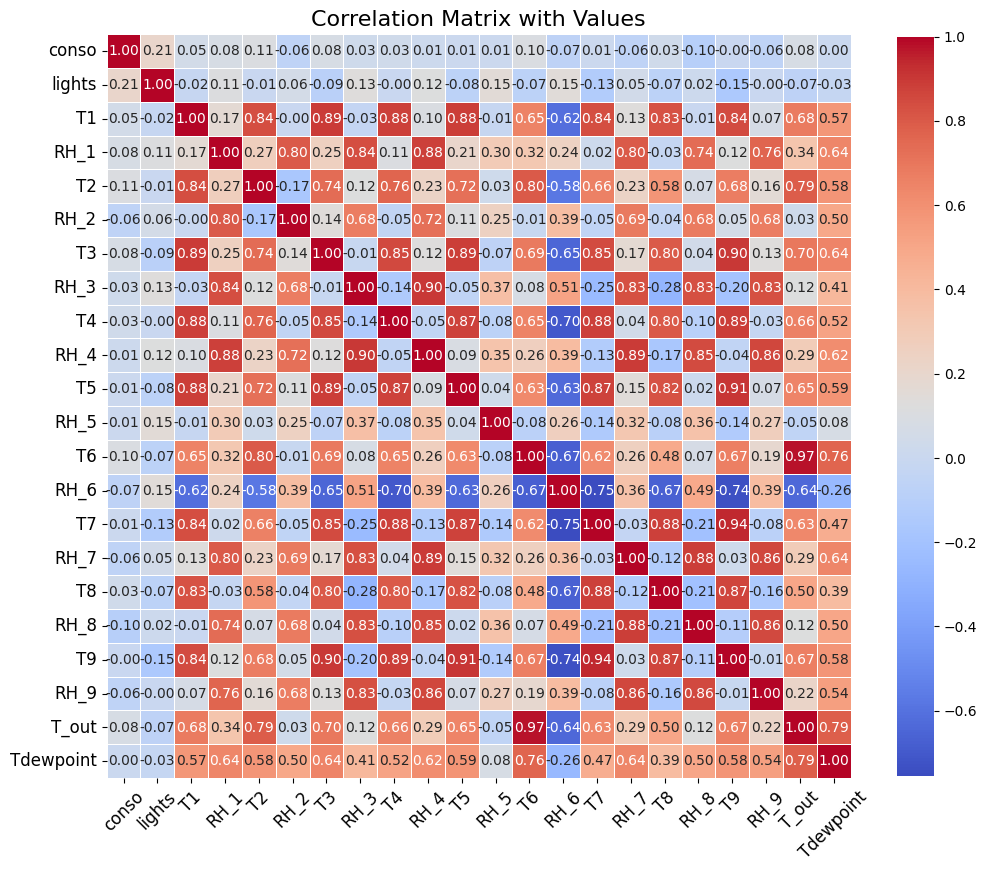

In [34]:
# Calculate the correlation matrix
corr_matrix = new_data.corr()

# Plot the heatmap
plt.figure(figsize=(12, 12))  # Adjust figure size
sns.heatmap(
    corr_matrix,
    annot=True,            # Show correlation values on the heatmap
    fmt=".2f",             # Format values to 2 decimal places
    cmap="coolwarm",       # Diverging color map (red = negative, blue = positive)
    square=True,           # Keep cells square-shaped
    linewidths=0.5,        # Add clear grid lines between cells
    cbar_kws={"shrink": 0.8}  # Shrink the color bar
)

# Add labels and a title
plt.title("Correlation Matrix with Values", fontsize=16)
plt.xticks(fontsize=12, rotation=45)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=12)
plt.show()
